In [168]:
import re

# Function to parse the artifacts.log file
def parse_artifacts_log(file_path):
    with open(file_path, 'r') as file:
        log_content = file.readlines()

    artifacts_data = {}
    for line in log_content:
        # Modified to exclude 'x4.png' or '.png' from the image names
        match = re.search(r'Processed (\S+?)(x4\.png|\.png)? with (\S+ artifact), random area: (\d+)', line)
        if match:
            image_name, _, artifact, area = match.groups()
            artifacts_data[image_name] = {'artifact': artifact, 'area': int(area)}
    return artifacts_data



In [169]:

def parse_sr_log(file_path):
    with open(file_path, 'r') as file:
        log_content = file.readlines()

    data = {}
    for line in log_content:
        # Modified to correctly parse image names without '.png'
        match = re.search(r': (\S+?)(?:x4\.png|\.png)? - PSNR: (\S+) dB; SSIM: (\S+).', line)
        if match:
            image_name, psnr, ssim = match.groups()
            data[image_name] = {'PSNR': float(psnr), 'SSIM': float(ssim)}

    return data


In [170]:
def parse_swin_log(file_path):
    with open(file_path, 'r') as file:
        log_content = file.readlines()

    data = {}
    for line in log_content:
        # Modified to correctly parse image names without '.png'
        match = re.search(r': (\S+?) - PSNR: (\S+) dB; SSIM: (\S+).', line)
        if match:
            image_name, psnr, ssim = match.groups()
            data[image_name] = {'PSNR': float(psnr), 'SSIM': float(ssim)}

    return data

In [171]:
# File paths in Colab
artifacts_log_path = '/content/artifacts.log'
swinir_log_path = '/content/swinir.log'
msrresnet_log_path = '/content/msrresnet.log'
dncnn_log_path = '/content/dncnn.log'

# Parsing both log files
artifacts_data = parse_artifacts_log(artifacts_log_path)
swinir_data = parse_swin_log(swinir_log_path)
msrresnet_data = parse_sr_log(msrresnet_log_path)
dncnn_data = parse_sr_log(dncnn_log_path)


In [172]:
# Adjusting the merge function to only include images present in all three datasets and exclude 'N/A' values

def merge_all_data(artifacts_data, swinir_data, msrresnet_data, dncnn_data):
    combined_data = {}

    for image_name, artifact_info in artifacts_data.items():
        # Only include images present in all datasets
        if image_name in msrresnet_data and image_name in dncnn_data and image_name in swinir_data:
            combined_entry = artifact_info.copy()
            combined_entry.update({
                'swinir PSNR': swinir_data[image_name]['PSNR'],
                'swinir SSIM': swinir_data[image_name]['SSIM'],
                'msrresnet PSNR': msrresnet_data[image_name]['PSNR'],
                'msrresnet SSIM': msrresnet_data[image_name]['SSIM'],
                'dncnn PSNR': dncnn_data[image_name]['PSNR'],
                'dncnn SSIM': dncnn_data[image_name]['SSIM']
            })
            combined_data[image_name] = combined_entry


    return combined_data

# Merging the data from all three sources
combined_data = merge_all_data(artifacts_data, swinir_data, msrresnet_data, dncnn_data)

# Displaying a few combined entries as a preview
list_combined_data=list(combined_data.items())  # Display first 10 entries for a preview



In [173]:
list(combined_data.items())

[('participant_02_sets_09_frame089R',
  {'artifact': 'motion artifact',
   'area': 498,
   'swinir PSNR': 23.69,
   'swinir SSIM': 0.919,
   'msrresnet PSNR': 33.12,
   'msrresnet SSIM': 0.9583,
   'dncnn PSNR': 30.99,
   'dncnn SSIM': 0.9289}),
 ('participant_02_sets_06_frame046B',
  {'artifact': 'NO artifact',
   'area': 339,
   'swinir PSNR': 23.68,
   'swinir SSIM': 0.929,
   'msrresnet PSNR': 31.94,
   'msrresnet SSIM': 0.9727,
   'dncnn PSNR': 32.76,
   'dncnn SSIM': 0.9369}),
 ('participant_02_sets_09_frame130B',
  {'artifact': 'motion artifact',
   'area': 199,
   'swinir PSNR': 24.85,
   'swinir SSIM': 0.938,
   'msrresnet PSNR': 29.75,
   'msrresnet SSIM': 0.9713,
   'dncnn PSNR': 32.7,
   'dncnn SSIM': 0.9358}),
 ('participant_02_sets_04_frame115R',
  {'artifact': 'ghosting artifact',
   'area': 333,
   'swinir PSNR': 24.58,
   'swinir SSIM': 0.9,
   'msrresnet PSNR': 24.33,
   'msrresnet SSIM': 0.9014,
   'dncnn PSNR': 28.79,
   'dncnn SSIM': 0.9}),
 ('participant_02_sets_0

In [174]:
def calculate_averages(combined_data):
    artifact_stats = {}

    for image_name, data in combined_data.items():
        artifact_type = data['artifact']

        # Initialize artifact entry if not already present
        if artifact_type not in artifact_stats:
            artifact_stats[artifact_type] = {
                'swinir': {'total_PSNR': 0, 'total_SSIM': 0, 'count': 0},
                'msrresnet': {'total_PSNR': 0, 'total_SSIM': 0, 'count': 0},
                'dncnn': {'total_PSNR': 0, 'total_SSIM': 0, 'count': 0}
            }

        if 'swinir PSNR' in data and 'swinir SSIM' in data:
            artifact_stats[artifact_type]['swinir']['total_PSNR'] += data['swinir PSNR']
            artifact_stats[artifact_type]['swinir']['total_SSIM'] += data['swinir SSIM']
            artifact_stats[artifact_type]['swinir']['count'] += 1

        # Add MSRResNet data if available
        if 'msrresnet PSNR' in data and 'msrresnet SSIM' in data:
            artifact_stats[artifact_type]['msrresnet']['total_PSNR'] += data['msrresnet PSNR']
            artifact_stats[artifact_type]['msrresnet']['total_SSIM'] += data['msrresnet SSIM']
            artifact_stats[artifact_type]['msrresnet']['count'] += 1

        # Add DNCNN data if available
        if 'dncnn PSNR' in data and 'dncnn SSIM' in data:
            artifact_stats[artifact_type]['dncnn']['total_PSNR'] += data['dncnn PSNR']
            artifact_stats[artifact_type]['dncnn']['total_SSIM'] += data['dncnn SSIM']
            artifact_stats[artifact_type]['dncnn']['count'] += 1



   # Calculating averages for each artifact type
    averages = {}
    for artifact, stats in artifact_stats.items():
        averages[artifact] = {
            'swinir_avg_PSNR': stats['swinir']['total_PSNR'] / stats['swinir']['count'] if stats['swinir']['count'] > 0 else None,
            'swinir_avg_SSIM': stats['swinir']['total_SSIM'] / stats['swinir']['count'] if stats['swinir']['count'] > 0 else None,
            'msrresnet_avg_PSNR': stats['msrresnet']['total_PSNR'] / stats['msrresnet']['count'] if stats['msrresnet']['count'] > 0 else None,
            'msrresnet_avg_SSIM': stats['msrresnet']['total_SSIM'] / stats['msrresnet']['count'] if stats['msrresnet']['count'] > 0 else None,
            'dncnn_avg_PSNR': stats['dncnn']['total_PSNR'] / stats['dncnn']['count'] if stats['dncnn']['count'] > 0 else None,
            'dncnn_avg_SSIM': stats['dncnn']['total_SSIM'] / stats['dncnn']['count'] if stats['dncnn']['count'] > 0 else None


            }

    return averages

# Calculate averages
artifact_averages = calculate_averages(combined_data)

# Displaying the average values for each artifact type
for artifact, avg_values in artifact_averages.items():
    print(f"Artifact: {artifact}, Averages: {avg_values}")


Artifact: motion artifact, Averages: {'swinir_avg_PSNR': 32.6155428091774, 'swinir_avg_SSIM': 0.957058198097373, 'msrresnet_avg_PSNR': 37.02679071068828, 'msrresnet_avg_SSIM': 0.976096054840513, 'dncnn_avg_PSNR': 29.974482372691654, 'dncnn_avg_SSIM': 0.8770818690542811}
Artifact: NO artifact, Averages: {'swinir_avg_PSNR': 35.02624611032528, 'swinir_avg_SSIM': 0.968228854313995, 'msrresnet_avg_PSNR': 41.839205091937856, 'msrresnet_avg_SSIM': 0.9866818387552956, 'dncnn_avg_PSNR': 30.566039603960416, 'dncnn_avg_SSIM': 0.8835850636492234}
Artifact: ghosting artifact, Averages: {'swinir_avg_PSNR': 26.10369589041096, 'swinir_avg_SSIM': 0.8974646575342433, 'msrresnet_avg_PSNR': 29.476816438356146, 'msrresnet_avg_SSIM': 0.937694273972608, 'dncnn_avg_PSNR': 26.2026575342466, 'dncnn_avg_SSIM': 0.8231515890410989}
Artifact: Gibbs artifact, Averages: {'swinir_avg_PSNR': 34.82324506890031, 'swinir_avg_SSIM': 0.9678189678465197, 'msrresnet_avg_PSNR': 46.25356660362078, 'msrresnet_avg_SSIM': 0.992219

In [175]:

def calculate_overall_averages(combined_data):
    total_msrresnet_psnr = 0
    total_msrresnet_ssim = 0
    total_swinir_psnr = 0
    total_swinir_ssim = 0
    total_dncnn_psnr = 0
    total_dncnn_ssim = 0
    msrresnet_count = 0
    dncnn_count = 0
    swinir_count = 0

    for data in combined_data.values():
        if 'swinir PSNR' in data and 'swinir SSIM' in data:
            total_swinir_psnr += data['swinir PSNR']
            total_swinir_ssim += data['swinir SSIM']
            swinir_count += 1
        # Summing MSRResNet data
        if 'msrresnet PSNR' in data and 'msrresnet SSIM' in data:
            total_msrresnet_psnr += data['msrresnet PSNR']
            total_msrresnet_ssim += data['msrresnet SSIM']
            msrresnet_count += 1

        # Summing DNCNN data
        if 'dncnn PSNR' in data and 'dncnn SSIM' in data:
            total_dncnn_psnr += data['dncnn PSNR']
            total_dncnn_ssim += data['dncnn SSIM']
            dncnn_count += 1


    # Calculating overall averages
    overall_avg_swinir_psnr = total_swinir_psnr / swinir_count if swinir_count > 0 else None
    overall_avg_swinir_ssim = total_swinir_ssim / swinir_count if swinir_count > 0 else None
    overall_avg_msrresnet_psnr = total_msrresnet_psnr / msrresnet_count if msrresnet_count > 0 else None
    overall_avg_msrresnet_ssim = total_msrresnet_ssim / msrresnet_count if msrresnet_count > 0 else None
    overall_avg_dncnn_psnr = total_dncnn_psnr / dncnn_count if dncnn_count > 0 else None
    overall_avg_dncnn_ssim = total_dncnn_ssim / dncnn_count if dncnn_count > 0 else None

    return {
        'overall_avg_swinir_psnr': overall_avg_swinir_psnr,
        'overall_avg_swinir_ssim': overall_avg_swinir_ssim,
        'overall_avg_msrresnet_psnr': overall_avg_msrresnet_psnr,
        'overall_avg_msrresnet_ssim': overall_avg_msrresnet_ssim,
        'overall_avg_dncnn_psnr': overall_avg_dncnn_psnr,
        'overall_avg_dncnn_ssim': overall_avg_dncnn_ssim
    }


overall_averages = calculate_overall_averages(combined_data)
print(overall_averages)



{'overall_avg_swinir_psnr': 31.066741676657745, 'overall_avg_swinir_ssim': 0.9369851978234279, 'overall_avg_msrresnet_psnr': 37.570291432260376, 'overall_avg_msrresnet_ssim': 0.9678256109932708, 'overall_avg_dncnn_psnr': 27.38120354145514, 'overall_avg_dncnn_ssim': 0.8176577469335066}


In [176]:
import pandas as pd

def create_artifact_averages_dataframe(combined_data):
    # Preparing a dictionary to hold the summed values and counts for each artifact
    artifact_sums = {}

    for image_data in combined_data.values():
        artifact_type = image_data['artifact']

        # Initialize dictionary for new artifact type
        if artifact_type not in artifact_sums:
            artifact_sums[artifact_type] = {'swinir_psnr_sum': 0, 'swinir_ssim_sum': 0,  'msrresnet_psnr_sum': 0, 'msrresnet_ssim_sum': 0,
                                          'dncnn_psnr_sum': 0, 'dncnn_ssim_sum': 0, 'count': 0}

        if 'swinir PSNR' in image_data and 'swinir SSIM' in image_data:
            artifact_sums[artifact_type]['swinir_psnr_sum'] += image_data['swinir PSNR']
            artifact_sums[artifact_type]['swinir_ssim_sum'] += image_data['swinir SSIM']

        # Sum PSNR and SSIM for MSRResNet and DNCNN
        if 'msrresnet PSNR' in image_data and 'msrresnet SSIM' in image_data:
            artifact_sums[artifact_type]['msrresnet_psnr_sum'] += image_data['msrresnet PSNR']
            artifact_sums[artifact_type]['msrresnet_ssim_sum'] += image_data['msrresnet SSIM']

        if 'dncnn PSNR' in image_data and 'dncnn SSIM' in image_data:
            artifact_sums[artifact_type]['dncnn_psnr_sum'] += image_data['dncnn PSNR']
            artifact_sums[artifact_type]['dncnn_ssim_sum'] += image_data['dncnn SSIM']



        artifact_sums[artifact_type]['count'] += 1

    # Preparing data for DataFrame
    data_for_df = []
    for artifact, sums in artifact_sums.items():
        row = {
            'Artifact': artifact,
            'SwinIR Avg PSNR': sums['swinir_psnr_sum'] / sums['count'] if sums['count'] > 0 else None,
            'SwinIR Avg SSIM': sums['swinir_ssim_sum'] / sums['count'] if sums['count'] > 0 else None,
            'MSRResNet Avg PSNR': sums['msrresnet_psnr_sum'] / sums['count'] if sums['count'] > 0 else None,
            'MSRResNet Avg SSIM': sums['msrresnet_ssim_sum'] / sums['count'] if sums['count'] > 0 else None,

            'DNCNN Avg PSNR': sums['dncnn_psnr_sum'] / sums['count'] if sums['count'] > 0 else None,
            'DNCNN Avg SSIM': sums['dncnn_ssim_sum'] / sums['count'] if sums['count'] > 0 else None
        }
        data_for_df.append(row)

    # Creating DataFrame
    df = pd.DataFrame(data_for_df)

    return df

# Example usage:
df = create_artifact_averages_dataframe(combined_data)
print(df)


                  Artifact  SwinIR Avg PSNR  SwinIR Avg SSIM  \
0          motion artifact        32.615543         0.957058   
1              NO artifact        35.026246         0.968229   
2        ghosting artifact        26.103696         0.897465   
3           Gibbs artifact        34.823245         0.967819   
4         low-SNR artifact        33.958763         0.927473   
5  susceptibility artifact        23.842084         0.904200   

   MSRResNet Avg PSNR  MSRResNet Avg SSIM  DNCNN Avg PSNR  DNCNN Avg SSIM  
0           37.026791            0.976096       29.974482        0.877082  
1           41.839205            0.986682       30.566040        0.883585  
2           29.476816            0.937694       26.202658        0.823152  
3           46.253567            0.992220       30.793818        0.884670  
4           35.546536            0.949091       26.196849        0.708031  
5           35.233659            0.965532       20.527291        0.730003  


In [177]:
df

,Artifact,SwinIR Avg PSNR,SwinIR Avg SSIM,MSRResNet Avg PSNR,MSRResNet Avg SSIM,DNCNN Avg PSNR,DNCNN Avg SSIM
0,motion artifact,32.615543,0.957058,37.026791,0.976096,29.974482,0.877082
1,NO artifact,35.026246,0.968229,41.839205,0.986682,30.566040,0.883585
2,ghosting artifact,26.103696,0.897465,29.476816,0.937694,26.202658,0.823152
3,Gibbs artifact,34.823245,0.967819,46.253567,0.992220,30.793818,0.884670
4,low-SNR artifact,33.958763,0.927473,35.546536,0.949091,26.196849,0.708031
5,susceptibility artifact,23.842084,0.904200,35.233659,0.965532,20.527291,0.730003


In [178]:
# Add a new row with 'Artifact' as 'overall' and values from overall_averages
df = df.append({'Artifact': 'overall',
                'SwinIR Avg PSNR': overall_averages['overall_avg_swinir_psnr'],
                'SwinIR Avg SSIM': overall_averages['overall_avg_swinir_ssim'],
                'MSRResNet Avg PSNR': overall_averages['overall_avg_msrresnet_psnr'],
                'MSRResNet Avg SSIM': overall_averages['overall_avg_msrresnet_ssim'],
                'DNCNN Avg PSNR': overall_averages['overall_avg_dncnn_psnr'],
                'DNCNN Avg SSIM': overall_averages['overall_avg_dncnn_ssim']},
               ignore_index=True)

<ipython-input-178-007b30dac3d6>:2: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({'Artifact': 'overall',


In [179]:
df.round(2)

,Artifact,SwinIR Avg PSNR,SwinIR Avg SSIM,MSRResNet Avg PSNR,MSRResNet Avg SSIM,DNCNN Avg PSNR,DNCNN Avg SSIM
0,motion artifact,32.62,0.96,37.03,0.98,29.97,0.88
1,NO artifact,35.03,0.97,41.84,0.99,30.57,0.88
2,ghosting artifact,26.10,0.90,29.48,0.94,26.20,0.82
3,Gibbs artifact,34.82,0.97,46.25,0.99,30.79,0.88
4,low-SNR artifact,33.96,0.93,35.55,0.95,26.20,0.71
5,susceptibility artifact,23.84,0.90,35.23,0.97,20.53,0.73
6,overall,31.07,0.94,37.57,0.97,27.38,0.82


from matplotlib import pyplot as plt
_df_0['SwinIR Avg PSNR'].plot(kind='hist', bins=20, title='SwinIR Avg PSNR')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['SwinIR Avg SSIM'].plot(kind='hist', bins=20, title='SwinIR Avg SSIM')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['MSRResNet Avg PSNR'].plot(kind='hist', bins=20, title='MSRResNet Avg PSNR')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['MSRResNet Avg SSIM'].plot(kind='hist', bins=20, title='MSRResNet Avg SSIM')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('Artifact').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='SwinIR Avg PSNR', y='SwinIR Avg SSIM', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='SwinIR Avg SSIM', y='MSRResNet Avg PSNR', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='MSRResNet Avg PSNR', y='MSRResNet Avg SSIM', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='MSRResNet Avg SSIM', y='DNCNN Avg PSNR', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_9['SwinIR Avg PSNR'].plot(kind='line', figsize=(8, 4), title='SwinIR Avg PSNR')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['SwinIR Avg SSIM'].plot(kind='line', figsize=(8, 4), title='SwinIR Avg SSIM')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_11['MSRResNet Avg PSNR'].plot(kind='line', figsize=(8, 4), title='MSRResNet Avg PSNR')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_12['MSRResNet Avg SSIM'].plot(kind='line', figsize=(8, 4), title='MSRResNet Avg SSIM')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_13['Artifact'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_13, x='SwinIR Avg PSNR', y='Artifact', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_14['Artifact'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_14, x='SwinIR Avg SSIM', y='Artifact', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_15['Artifact'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_15, x='MSRResNet Avg PSNR', y='Artifact', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_16['Artifact'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_16, x='MSRResNet Avg SSIM', y='Artifact', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [180]:
df=df.transpose()

In [181]:
filtered_data = []

for filename, info in list_combined_data:
    if info.get('artifact') == 'susceptibility artifact':
        filtered_data.append((filename, info))

print(filtered_data)

[('participant_02_sets_04_frame375R', {'artifact': 'susceptibility artifact', 'area': 491, 'swinir PSNR': 18.27, 'swinir SSIM': 0.878, 'msrresnet PSNR': 40.66, 'msrresnet SSIM': 0.9854, 'dncnn PSNR': 15.56, 'dncnn SSIM': 0.6476}), ('participant_02_sets_03_frame084R', {'artifact': 'susceptibility artifact', 'area': 405, 'swinir PSNR': 24.96, 'swinir SSIM': 0.931, 'msrresnet PSNR': 41.79, 'msrresnet SSIM': 0.9882, 'dncnn PSNR': 18.68, 'dncnn SSIM': 0.7512}), ('participant_02_sets_05_frame420R', {'artifact': 'susceptibility artifact', 'area': 414, 'swinir PSNR': 23.52, 'swinir SSIM': 0.925, 'msrresnet PSNR': 40.2, 'msrresnet SSIM': 0.9846, 'dncnn PSNR': 18.19, 'dncnn SSIM': 0.7418}), ('participant_02_sets_06_frame072R', {'artifact': 'susceptibility artifact', 'area': 489, 'swinir PSNR': 18.62, 'swinir SSIM': 0.873, 'msrresnet PSNR': 39.57, 'msrresnet SSIM': 0.9857, 'dncnn PSNR': 15.8, 'dncnn SSIM': 0.654}), ('participant_02_sets_02_frame119R', {'artifact': 'susceptibility artifact', 'area

In [182]:
filtered_data = []

for filename, info in list_combined_data:
    if info.get('artifact') == 'ghosting artifact':
        filtered_data.append((filename, info))

print(filtered_data)

[('participant_02_sets_04_frame115R', {'artifact': 'ghosting artifact', 'area': 333, 'swinir PSNR': 24.58, 'swinir SSIM': 0.9, 'msrresnet PSNR': 24.33, 'msrresnet SSIM': 0.9014, 'dncnn PSNR': 28.79, 'dncnn SSIM': 0.9}), ('participant_02_sets_05_frame250R', {'artifact': 'ghosting artifact', 'area': 382, 'swinir PSNR': 24.73, 'swinir SSIM': 0.905, 'msrresnet PSNR': 27.26, 'msrresnet SSIM': 0.9235, 'dncnn PSNR': 28.87, 'dncnn SSIM': 0.8999}), ('participant_02_sets_07_frame244R', {'artifact': 'ghosting artifact', 'area': 158, 'swinir PSNR': 25.24, 'swinir SSIM': 0.907, 'msrresnet PSNR': 26.38, 'msrresnet SSIM': 0.9225, 'dncnn PSNR': 28.89, 'dncnn SSIM': 0.9005}), ('participant_02_sets_07_frame012R', {'artifact': 'ghosting artifact', 'area': 390, 'swinir PSNR': 24.03, 'swinir SSIM': 0.893, 'msrresnet PSNR': 27.53, 'msrresnet SSIM': 0.9205, 'dncnn PSNR': 28.77, 'dncnn SSIM': 0.8981}), ('participant_02_sets_02_frame036R', {'artifact': 'ghosting artifact', 'area': 338, 'swinir PSNR': 24.86, 's

In [183]:
filtered_data = []

for filename, info in list_combined_data:
    if info.get('artifact') == 'motion artifact':
        filtered_data.append((filename, info))

print(filtered_data)

[('participant_02_sets_09_frame089R', {'artifact': 'motion artifact', 'area': 498, 'swinir PSNR': 23.69, 'swinir SSIM': 0.919, 'msrresnet PSNR': 33.12, 'msrresnet SSIM': 0.9583, 'dncnn PSNR': 30.99, 'dncnn SSIM': 0.9289}), ('participant_02_sets_09_frame130B', {'artifact': 'motion artifact', 'area': 199, 'swinir PSNR': 24.85, 'swinir SSIM': 0.938, 'msrresnet PSNR': 29.75, 'msrresnet SSIM': 0.9713, 'dncnn PSNR': 32.7, 'dncnn SSIM': 0.9358}), ('participant_02_sets_03_frame066R', {'artifact': 'motion artifact', 'area': 157, 'swinir PSNR': 25.03, 'swinir SSIM': 0.946, 'msrresnet PSNR': 34.29, 'msrresnet SSIM': 0.9821, 'dncnn PSNR': 32.55, 'dncnn SSIM': 0.9486}), ('participant_02_sets_04_frame125R', {'artifact': 'motion artifact', 'area': 272, 'swinir PSNR': 25.63, 'swinir SSIM': 0.949, 'msrresnet PSNR': 32.7, 'msrresnet SSIM': 0.9751, 'dncnn PSNR': 32.44, 'dncnn SSIM': 0.9435}), ('participant_02_sets_03_frame129R', {'artifact': 'motion artifact', 'area': 474, 'swinir PSNR': 25.89, 'swinir S

In [184]:
filtered_data = []

for filename, info in list_combined_data:
    if info.get('artifact') == 'NO artifact':
        filtered_data.append((filename, info))

print(filtered_data)

[('participant_02_sets_06_frame046B', {'artifact': 'NO artifact', 'area': 339, 'swinir PSNR': 23.68, 'swinir SSIM': 0.929, 'msrresnet PSNR': 31.94, 'msrresnet SSIM': 0.9727, 'dncnn PSNR': 32.76, 'dncnn SSIM': 0.9369}), ('participant_02_sets_09_frame133B', {'artifact': 'NO artifact', 'area': 224, 'swinir PSNR': 27.02, 'swinir SSIM': 0.949, 'msrresnet PSNR': 28.14, 'msrresnet SSIM': 0.9572, 'dncnn PSNR': 32.73, 'dncnn SSIM': 0.9365}), ('participant_02_sets_03_frame205R', {'artifact': 'NO artifact', 'area': 151, 'swinir PSNR': 24.83, 'swinir SSIM': 0.944, 'msrresnet PSNR': 34.49, 'msrresnet SSIM': 0.9845, 'dncnn PSNR': 32.58, 'dncnn SSIM': 0.9456}), ('participant_02_sets_04_frame051R', {'artifact': 'NO artifact', 'area': 451, 'swinir PSNR': 25.77, 'swinir SSIM': 0.954, 'msrresnet PSNR': 28.98, 'msrresnet SSIM': 0.9698, 'dncnn PSNR': 32.58, 'dncnn SSIM': 0.9476}), ('participant_02_sets_06_frame080B', {'artifact': 'NO artifact', 'area': 169, 'swinir PSNR': 25.21, 'swinir SSIM': 0.94, 'msrre

In [185]:
filtered_data = []

for filename, info in list_combined_data:
    if info.get('artifact') == 'low-SNR artifact':
        filtered_data.append((filename, info))

print(filtered_data)

[('participant_02_sets_07_frame176B', {'artifact': 'low-SNR artifact', 'area': 494, 'swinir PSNR': 34.94, 'swinir SSIM': 0.925, 'msrresnet PSNR': 36.19, 'msrresnet SSIM': 0.9447, 'dncnn PSNR': 27.13, 'dncnn SSIM': 0.6728}), ('participant_02_sets_03_frame129B', {'artifact': 'low-SNR artifact', 'area': 204, 'swinir PSNR': 35.2, 'swinir SSIM': 0.934, 'msrresnet PSNR': 36.63, 'msrresnet SSIM': 0.9546, 'dncnn PSNR': 27.28, 'dncnn SSIM': 0.681}), ('participant_02_sets_07_frame272B', {'artifact': 'low-SNR artifact', 'area': 326, 'swinir PSNR': 34.89, 'swinir SSIM': 0.925, 'msrresnet PSNR': 36.2, 'msrresnet SSIM': 0.9456, 'dncnn PSNR': 27.11, 'dncnn SSIM': 0.6753}), ('participant_02_sets_04_frame019B', {'artifact': 'low-SNR artifact', 'area': 406, 'swinir PSNR': 35.0, 'swinir SSIM': 0.932, 'msrresnet PSNR': 36.22, 'msrresnet SSIM': 0.9511, 'dncnn PSNR': 27.2, 'dncnn SSIM': 0.6775}), ('participant_02_sets_06_frame082R', {'artifact': 'low-SNR artifact', 'area': 359, 'swinir PSNR': 34.89, 'swinir

In [186]:
filename_to_find = 'participant_13_sets_01_frame017B.png'
#'participant_02_sets_04_frame115R.png'

found_entry = None

for filename, info in list_combined_data:
    if filename == filename_to_find:
        found_entry = (filename, info)
        break

if found_entry:
    print(found_entry)
else:
    print(f"Entry with filename '{filename_to_find}' not found.")

Entry with filename 'participant_13_sets_01_frame017B.png' not found.


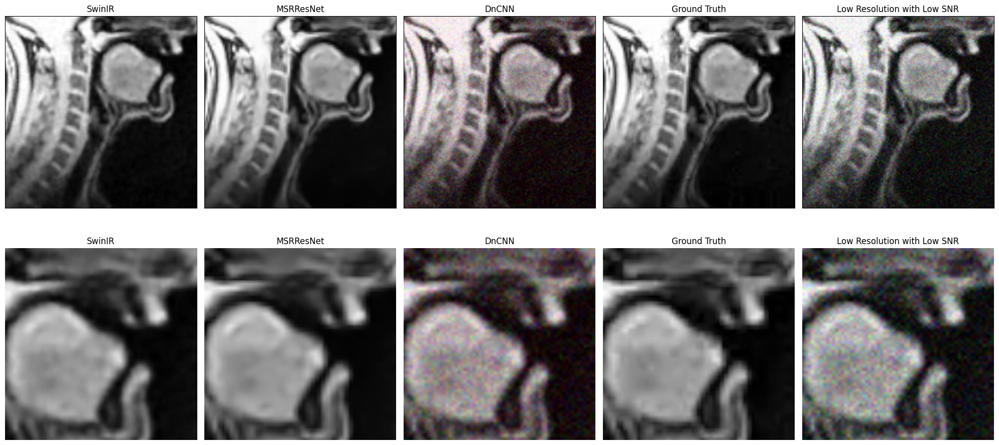

In [187]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

# Load the images
image_name='participant_13_sets_01_frame017B'
#image_name= 'participant_02_sets_06_frame080B'
#image_name= 'participant_13_sets_06_frame262R'
msrresnet_path = '/content/'+image_name+'-msrresnet.png'
dncnn_path = '/content/'+image_name+'-dncnn.png'
swinir_path= '/content/'+ image_name +'_SwinIR.png'
gt_path = '/content/'+image_name+'-gt.png'
lr_path = '/content/'+image_name+'-lr.png'


msrresnet_image = Image.open(msrresnet_path)
dncnn_image = Image.open(dncnn_path)
swinir_image = Image.open(swinir_path)
gt_image = Image.open(gt_path)
lr_image = Image.open(lr_path)

#make sure all images are the same size as the ground truth image for fair comparison
target_size = gt_image.size

# Resize images if necessary
msrresnet_image = ImageOps.contain(msrresnet_image, target_size)
dncnn_image = ImageOps.contain(dncnn_image, target_size)
swinir_image = ImageOps.contain(swinir_image, target_size)
lr_image = ImageOps.contain(lr_image, target_size)

# Crop the same area from each image for a zoomed comparison
offset=50
#crop_area = (target_size[0]//4, target_size[1]*3//4, target_size[0]*3//4, target_size[1])
#crop_area = ((target_size[0] - target_size[0]//2)//2 + offset, target_size[1] - target_size[0]//2, (target_size[0] + target_size[0]//2)//2 + offset, target_size[1])
#crop_area = (target_size[0]//4, target_size[1]//4, target_size[0]*3//4, target_size[1]//4) #top middle

#crop_area = (target_size[0]//4 + offset, target_size[1]//4, target_size[0]*3//4 + offset, target_size[1]*3//4)
#crop_area = (target_size[0]//4, target_size[1]//4, target_size[0]*3//4, target_size[1]*3//4) #middle
#crop_area = (target_size[0]*3//4, 0, target_size[0], target_size[1]//4)
#crop_area = (target_size[0]//4, 0, target_size[0]*3//4, target_size[1]//2)
#crop_area = (target_size[0] // 4, target_size[1] // 2, target_size[0] * 3 // 4, target_size[1])

#crop_area = (target_size[0] // 2, target_size[1] // 2, target_size[0], target_size[1]) #right middle bottom
#crop_area = (target_size[0] // 2, target_size[1] // 4, target_size[0], target_size[1] * 3 // 4)
#crop_area = (target_size[0] // 4, 0, target_size[0] * 3 // 4, target_size[1] // 2)
crop_area = (target_size[0] // 2, 0, target_size[0], target_size[1] // 2) #top right quarter

#crop_area = (0, 0, target_size[0]//2, target_size[1]//2)  # Top-left quarter
#crop_area = (0, target_size[1]//4, target_size[0]//2, 3*target_size[1]//4)
msrresnet_zoomed = msrresnet_image.crop(crop_area)
dncnn_zoomed = dncnn_image.crop(crop_area)
swinir_zoomed = swinir_image.crop(crop_area)
gt_zoomed = gt_image.crop(crop_area)
lr_zoomed = lr_image.crop(crop_area)

# Display images side by side with titles
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Set titles
titles = ['SwinIR', 'MSRResNet', 'DnCNN' ,'Ground Truth', 'Low Resolution with Low SNR']

# Display original images
axes[0, 0].imshow(swinir_image)
axes[0, 1].imshow(msrresnet_image)
axes[0, 2].imshow(dncnn_image)
axes[0, 3].imshow(gt_image)
axes[0, 4].imshow(lr_image)

# Display zoomed images
axes[1, 0].imshow(swinir_image)
axes[1, 1].imshow(msrresnet_image)
axes[1, 2].imshow(dncnn_image)
axes[1, 3].imshow(gt_image)
axes[1, 4].imshow(lr_image)

# Set titles and turn off axis labels
for ax, img, title in zip(axes[0], [swinir_image, msrresnet_image, dncnn_image,  gt_image, lr_image], titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])


# Display zoomed images with titles
for ax, img, title in zip(axes[1], [swinir_zoomed, msrresnet_zoomed, dncnn_zoomed, gt_zoomed, lr_zoomed], titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')




# Adjust layout
plt.tight_layout()
plt.show()


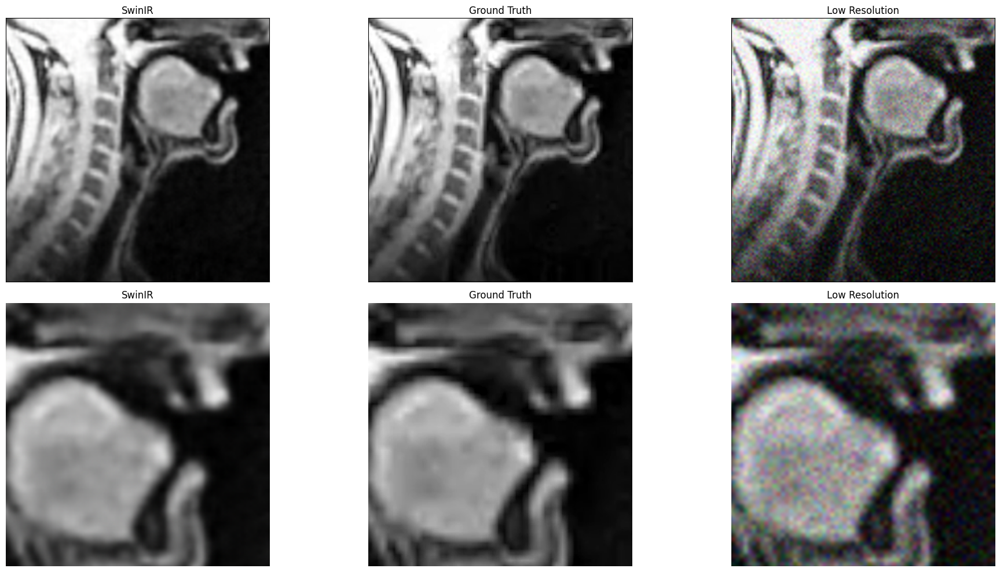

In [188]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
titles=['SwinIR', 'Ground Truth', 'Low Resolution']
# Display original images
axes[0, 0].imshow(swinir_image)
axes[0, 1].imshow(gt_image)
axes[0, 2].imshow(lr_image)

# Display zoomed images
axes[1, 0].imshow(swinir_zoomed)
axes[1, 1].imshow(gt_zoomed)
axes[1, 2].imshow(lr_zoomed)

# Set titles and turn off axis labels
for ax, img, title in zip(axes[0], [swinir_image, gt_image, lr_image], titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])

# Display zoomed images with titles
for ax, img, title in zip(axes[1], [swinir_zoomed, gt_zoomed, lr_zoomed], titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')


# Adjust layout
plt.tight_layout()
plt.show()


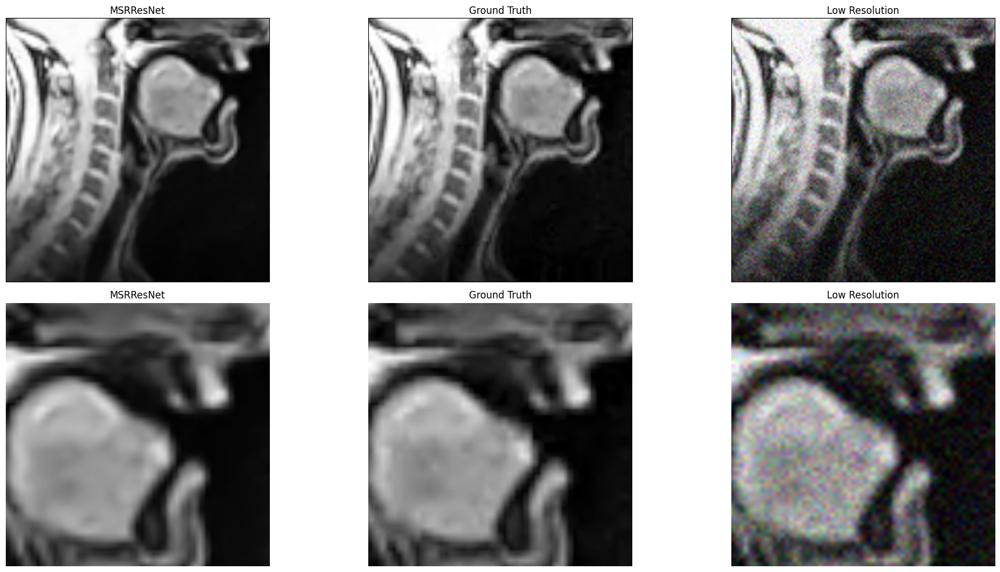

In [189]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
titles=['MSRResNet', 'Ground Truth', 'Low Resolution']
# Display original images
axes[0, 0].imshow(msrresnet_image)
axes[0, 1].imshow(gt_image)
axes[0, 2].imshow(lr_image)

# Display zoomed images
axes[1, 0].imshow(msrresnet_zoomed)
axes[1, 1].imshow(gt_zoomed)
axes[1, 2].imshow(lr_zoomed)

# Set titles and turn off axis labels
for ax, img, title in zip(axes[0], [msrresnet_image, gt_image, lr_image], titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.set_xticks([])
    ax.set_yticks([])

# Display zoomed images with titles
for ax, img, title in zip(axes[1], [msrresnet_zoomed, gt_zoomed, lr_zoomed], titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')


# Adjust layout
plt.tight_layout()
plt.show()
